# Learned adaptive illumination multiphoton microscopy
In this notebook, we demonstrate how to implement [Learned Adaptive Multiphoton Illumination microscopy (LAMI)](https://www.biorxiv.org/content/10.1101/2020.08.14.251314v1), using [Pycro-Manager](https://pycro-manager.readthedocs.io/en/latest/) and [Micro-Magellan](https://micro-manager.org/wiki/MicroMagellan). Throughout the tutorial, we'll use [Napari](https://napari.org/) for visualizing data. This technique enables automatic sample-dependent adjustment of excitation laser power in real time while imaging a sample on a 2-photon microscope in order to compensate for attenuation of fluorescence when imaging deep into intact tissue.

This notebook outlines all the steps for implementing this technique, including microscope control software, how to run experiments, how to analyze the data and train the machine learning model, and how to apply its predictions in real time when collecting new data. Each of these steps is implemented with entirely open-source software. The tutorial is entirely in Python, with the exception of the first part that deals with the hardware setup and may require modifying C/C++ code.

The tutorial aims to be as modular as possible, so that ideas/techniques can be drawn from it and applied to other applications.

Although running through the full tutorial in sequence is how one would set up this experiment in practice, we've provided demo data at various steps along the way both as a way to check that things work as expected, and to allow the sections to be run independently.


## Background

When imaging deep into a sample using 2-photon microscopy, excitation light focusing to different points in the sample will be subjected to different amounts of scattering, and the excitation laser power must be increased in order to maintain signal. Failing to increase sufficiently will lead to the loss of detectable fluorescence. Increasing too much subjects the sample to unnecessary photobleaching and photodamage, with the potential to disrupt or alter the biological processes under investigation. 

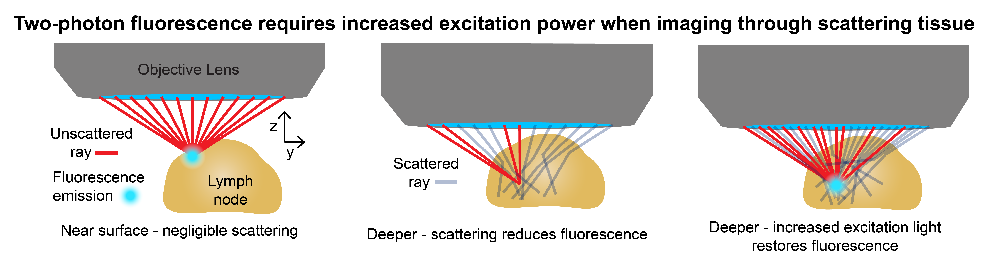

This problem can be solved by using cells with identical fluorescent labels (i.e. standard candles) imaged in situ to train a physics-based machine learning model. After this training has been performed, the correct illumination power can be predicted and adaptively adjusted at each point in a 3D volume on subsequent samples as a function of the sample's shape, without the need for specialized fluorescent labelling. 

### Requirements
This tutorial was created using the following python packages and versions

napari:                             0.4.0 \
tensorflow:                         2.3.1 \
scikit-image:                       0.17.2 \
numpy:                              1.18.1 \
pycromanager:                       0.7.6

## Overview

This tutorial will go through the full process in the figure below and is broken down in the following sections

1) Setup

 -  Required hardware: Time-realized spatial light modulator
 
 -  Calibrating XY stage

 -  How to use Micro-Magellan + surfaces to collect data 

2) Collect and process training data

 - Control microscope to image standard candle cells with randomized power

 - Run 3D segmentation on this data to extract needed information
 
 - Process segmented cells to get features needed for neural network training

3) Train neural network to predict excitation laser control

 - Train network
 
 - Visualize predictions of trained network

4) Use the trained model to modulate excitation power on subsequent experiments

An overview of everything that will be done in this notebook is in the figure below
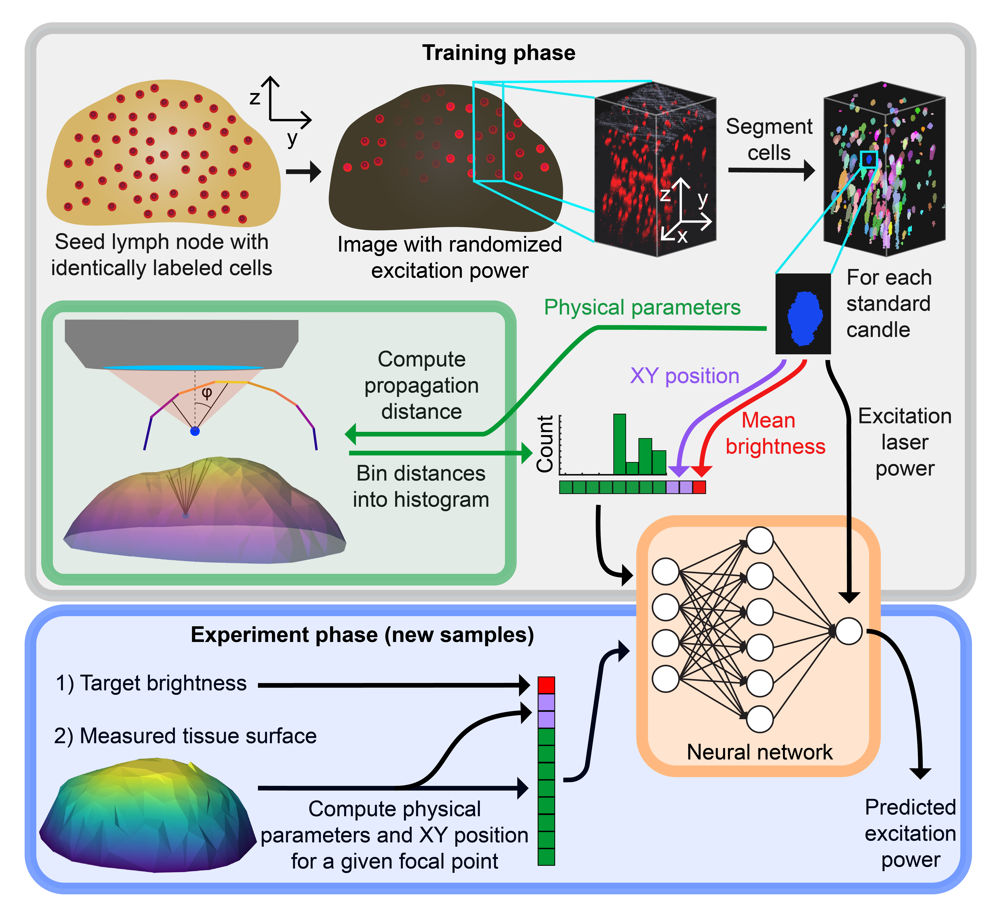

## 1) Setup

### Hardware: Time-realized spatial light modulator

Utilizing Learned adaptive multiphoton illumination requires the ability to modulate excitation laser power over a single field of view. A two photon microscope with an existing EOM or AOM for modulating laser power can be easily modified into a "time-realized spatial light modulator" (TR-SLM) (see [paper](https://www.biorxiv.org/content/10.1101/2020.08.14.251314v1) for full description). 

The TR-SLM can be controlled through the SLM device API in Micro-Manager. The TR-SLM we describe has two important software components. One is the Arduino firmware (located [here](https://github.com/micro-manager/micro-manager/blob/master/DeviceAdapters/TeesnySLM/teensySLMFirmware/teensySLMFirmware.ino)), which runs on the Teensy3.2 microcontroller that is the heart of the TR-SLM. The second is a Micro-Manager [device adapter](https://micro-manager.org/wiki/Building_Micro-Manager_Device_Adapters) (found [here](https://github.com/micro-manager/micro-manager/tree/master/DeviceAdapters/TeesnySLM)), which provides the glue to convert the Micro-Manager SLM API into the serial commands expected by the firmware on the Teensy. It is likely that the firmware running on the Teensy will need to be modified, since it contains parameters specific to the scanning pattern of our microscope, which has a resonant scanning mirror with a fixed period scan time on one axis and a galvo scanner on the other axis. However, the device adapter code might not need to be modified. A pre-built version of it comes with 

An example Micro-Manager configuration file using this device adapter can be found [here](https://github.com/henrypinkard/LymphoSight/blob/master/hardware/BIDC_MMconfig_Gen3_Magellan_default_new_piezo.cfg). There are many things in the configuration file that are specific to the microscope on which we used that won't neccessarily need to be duplicated, but the parts referencing "TeensySLM" should be fairly generic. Note that this configuration corresponds to a system with two TeensySLMs (one for each EOM/Laser).

### Calibrate XY stage
We need to calibrate the "affine transform" matrix, which gives the relation between the coordinate space of pixels on the camera and coordinates of the XY stage.

First go here:
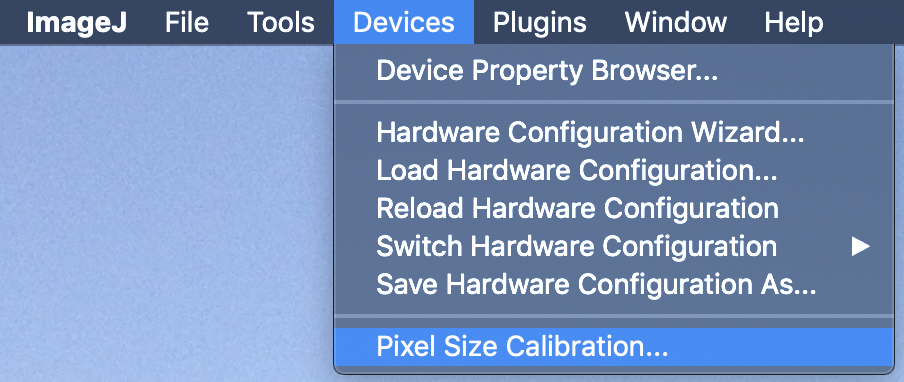

Then select "edit". Then use "calculate" or "measure" to either manually or automatically figure this out (You need a high contrast sample that is firmly secured in place to get an accurate calibration)

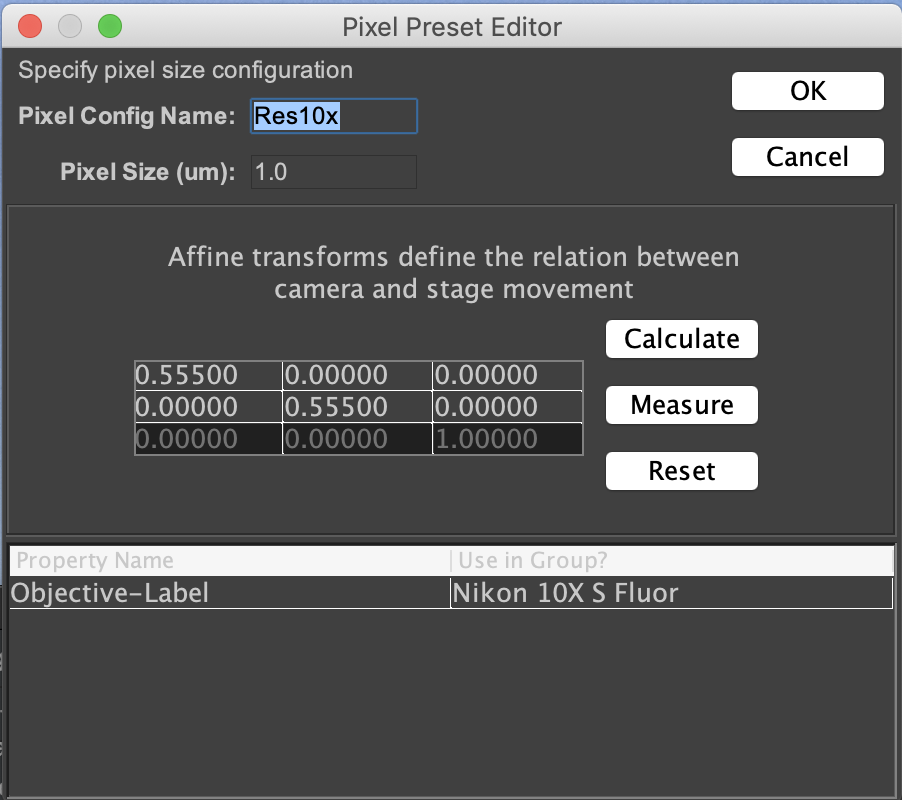

### Creating surfaces and collecting data with Micro-Magellan
To acquire data, we will be using a combination of [Micro-Magellan](https://micro-manager.org/wiki/MicroMagellan) and [Pycro-Manager](https://pycro-manager.readthedocs.io/en/latest/). Micro-Magellan (available in Micro-Manager plugins menu) provides the graphical user interface (GUI) for mapping samples and setting up experiments, and Pycro-Manager enables injection of customized code to run during those experiments for various purposes.

The first step when acquiring data will often be to map the top the sample with a "surface" in Micro-Magellan. To do so, we are going to mark a bunch points on the surface, which the software will use to interpolate a surface (see figure below). A walkthrough of how to do this can be found in [this video](https://www.youtube.com/watch?v=wKVMWFeCF6o).

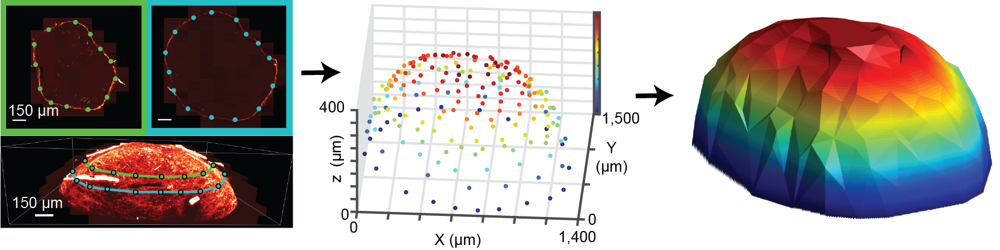

## 2) Collect and process training data

In this next section, we'll demonstrate how to set up an experiment that images each Z-stack with a random amount of power

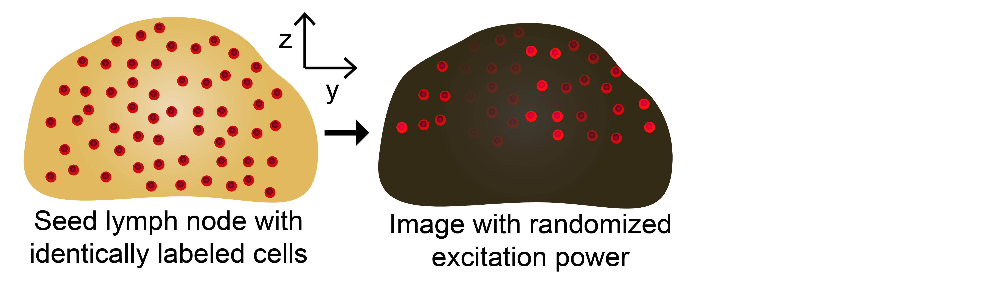

After creating a surface in Micro-Magellan that marks the top of the sample, we want an acquisition that acquires data up to a fixed depth below this surface. This can be down with the following acquisition settings (for a depth of 300 µm below the surface):


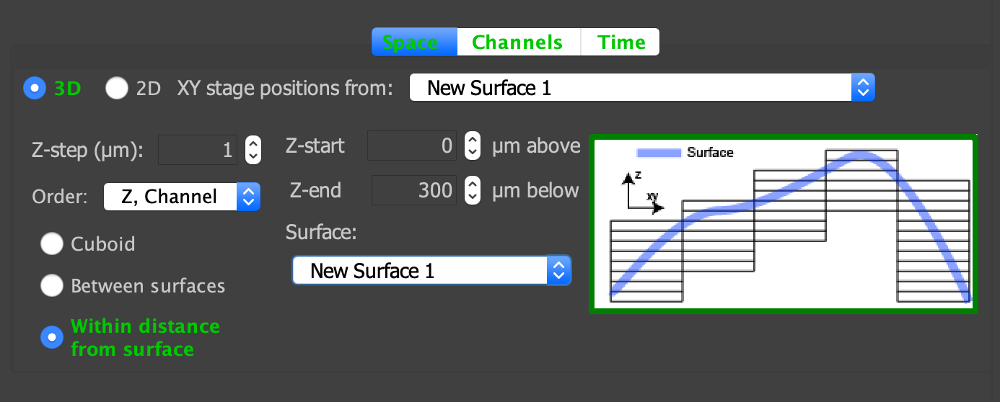

Next we need to create a way to randomly modulate excitation power at each XY position. This can be accomplished using an [acquisition hook](https://pycro-manager.readthedocs.io/en/latest/acq_hooks.html) in Pycro-Manager. Specifically, we're going to use the acquisition hook to randomly set the power at each XY position. 

Using the TeensySLM device adapter, we can control the incident power by changing the value of`'ManualVoltage'` property, which sets a single voltage level for the full field of view. It is important to know the correspondence between the voltage and the incident power on the sample so that this can be done in a reasonable way. We measured this using an optical power meter placed at the microscopes focal plane.

In the function below we show how to set a random power at each XY position. The simplest way to do this is to just set a single power for each Z position. However, this may be pretty inefficient and could lead to damaging the deeper parts of the sample. In light of this, we also show a more complicated version, in which the distance below the sample surface is used to increase power.

In practice, this function may need to be modified empirically in order to generate power estimates within reason for the particular microscope/sample.

In [1]:
import numpy as np
from pycromanager import Acquisition

# Simple version that sets random power at each XY position
def hook_fn_simple(event, bridge, event_queue):
    # get the Micro-Manager core
    core = bridge.get_core()
    # generate a random power specific to the current XY position
    np.random.seed(event['axes']['position'])
    voltage = np.random.rand()
    # rescale to the min and max voltage of our system
    voltage = int(255 * voltage)

    core.set_property('TeensySLM', 'ManualVoltage', voltage)

    return event

# Complicated version that takes depth into account
def hook_fn_complicated(event, bridge, event_queue):
    
    
    surf = bridge.get_magellan().get_surface('New Surface 1')
    interp_val = surf.get_extrapolated_value(event['x'], event['y'])
    # get the depth below the sample surface at the center of the XY position
    depth_below = min(interp_val - event['z'], 0)
    # how much we want to increase power by
    scale = depth_below / 100
    
    # generate a random power specific to the current XY position
    np.random.seed(event['axes']['position'])
    voltage = np.random.rand()
    
    # increase voltage based on dpeth below
    # in practice might make sense to convert to power before scaling,
    # see voltage_to_power function later in this notebook
    voltage *= scale
    
    # rescale to the min and max voltage of our system
    voltage = int(255 * voltage)

    # get the Micro-Manager core
    core = bridge.get_core()
    core.set_property('TeensySLM', 'ManualVoltage', voltage)

    return event



# Run the Micro-Magellan acquistion that we set up in the GUI
acq = Acquisition(magellan_acq_index=0, post_hardware_hook_fn=hook_fn_simple)

### Load data, segment cells
Now that we've acquired training data, we will process it in order to extract training data for the neural network. For this part of the tutorial, we will use [Napari](https://napari.org/), which provides a useful multi-dimensional viewer. Note: this requires having installed napari. Visit the Napari documentation for up-to-date instructions on doing this

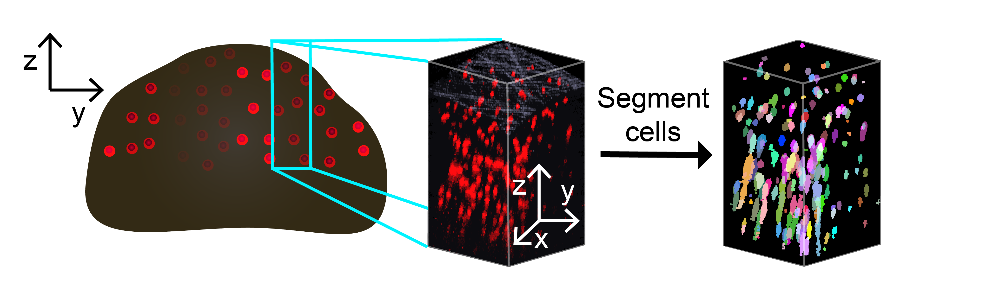

First, we load in the data we just acquired 

In [1]:
from pycromanager import Dataset

##TODO: your dataset path here
dataset_dir = '/Users/henrypinkard/tmp/experiment_1_28'

# open the dataset
dataset = Dataset(dataset_dir)
# open the data as one big array (with an axis corresponding to xy position)
data = dataset.as_array()
# open the data as one big array with xy positions stitched into one big image
stitched_data = dataset.as_array(stitched=True)
# print the names of the axes 
print(dataset.axes.keys())
# show general information about the data
data

Dataset opened of 11
dict_keys(['z', 'position', 'channel'])


,Array,Chunk
Bytes,1.93 GB,19.92 MB
Shape,"(97, 19, 2, 512, 512)","(1, 19, 2, 512, 512)"
Count,160 Tasks,97 Chunks
Type,uint16,numpy.ndarray


We can visualize this data in napari (it can be helpful to move in 3D mode in napari, which is currently done by clicking the "Toggle number of displayed dimensions" button). You might need to play around with the order of your axes to get this to work properly:

In [57]:
import napari

with napari.gui_qt():
    v = napari.Viewer()
    v.add_image(data)

We can also visualize the data as one large stitched volume (i.e. as it appears in Micro-Magellan)

In [175]:
with napari.gui_qt():
    v = napari.Viewer()
    v.add_image(stitched_data)

The next step is to run a 3D segmentation of the image data to identify the location and brightness of each standard candle. Here we show a simple segmentation using [scikit-image](https://scikit-image.org/). This will likely need to be adapted based on the particular data.


First we show how to do this on a single 3D image using example data

In [2]:
import numpy as np
from skimage.measure import label, regionprops

def do_segmentation(image_3d):
    # do a thresholding operation to idenify cells based on brightness
    # then find distinct cells in the 3D image and return their location and mean brightness
    # Here we do a very basic thresholding based on percentiles of the image distribution
    # This will almost certainly need to be adapted/improved for your own data
    
    thresh_min = np.percentile(image_3d, 99.9)
    binary_min = image_3d > thresh_min

    # identify distinct image regions corresponding to each cell
    label_image = label(binary_min)
    
    cell_indices = np.unique(label_image)[1:]
    print('located {} cells'.format(len(cell_indices)))
    
    # get the centroids and mean brightness of each standard candle
    region_properties = regionprops(label_image, image_3d)
    locations = np.stack([rp.centroid for rp in region_properties])
    # give image locations relative to center of the image (this is important for the next
    # step when we will transform them into coordinates of the XY stage)
    locations[:, 1:] -= np.array(image_3d.shape[1:]) / 2
    brightness = np.stack([rp.mean_intensity for rp in region_properties])
    
    return locations, brightness
    
    
# TODO: replace this with your own data
test_data = np.load('segmentation_test_data.npz')['test_data'][:50]
zyx_pixel_locations, brightness = do_segmentation(test_data)

located 28 cells


We can visualize the results of this using napari:

In [177]:
import napari 

with napari.gui_qt():
    v = napari.Viewer()
    v.add_image(test_data)
    v.add_points(zyx_pixel_locations)

It should like something like this (with 3D mode turned on):
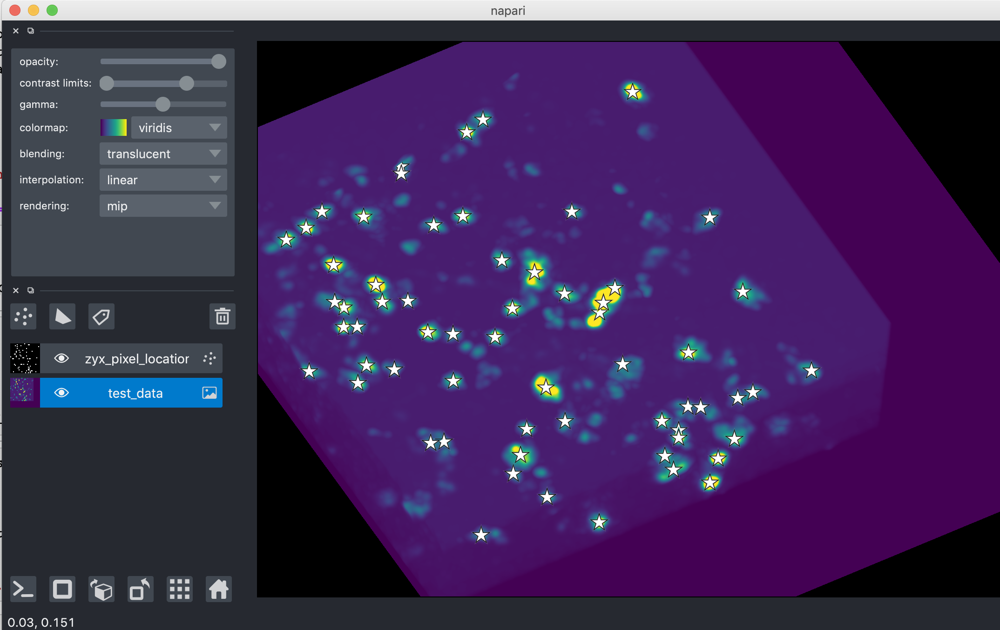

### Process segmented cells to get features needed for neural network training
Now we need to convert the zyx positions of cells in pixel space to the µm coordinates, so that they their positions relative to the Micro-Magellan surface (which is itself in the coordinate space of the stage) can be computed. First, we extract all the relevant metadata from the loaded dataset that allows us to make this conversion


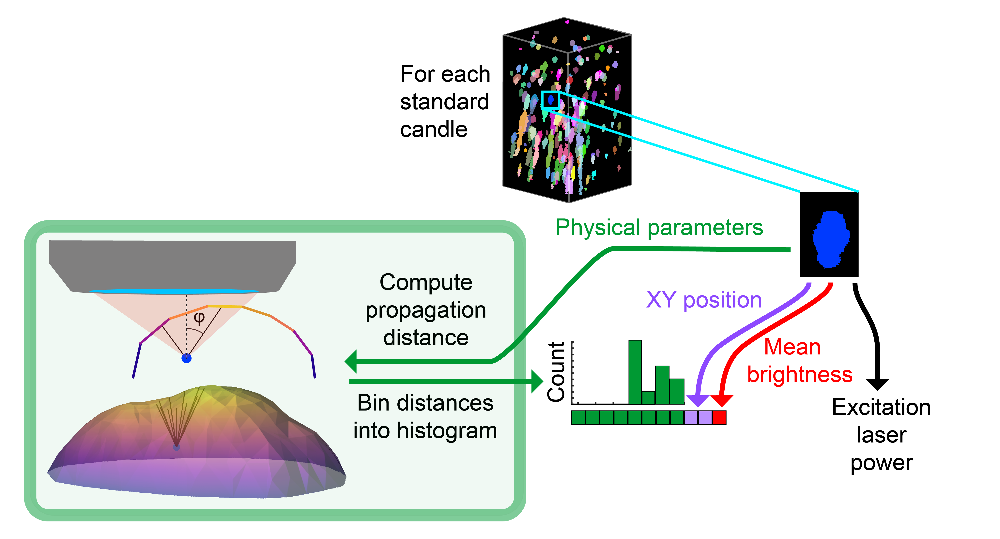

In [3]:
from lami_helper import LAMI_helper

# Read the affine transform (really a linear transform, since its a 2x2 matrix) from the metadata, 
# which gives the relation between xy pixel coordinates and XY stage coordinates
affine_transform = np.array([float(s) for s in dataset.summary_metadata[
    'AffineTransform'].split('_')]).reshape((2,2))

#now read the XYZ points that were used to create the surface in Micro-Magellan
image_metadata = dataset.read_first_image_metadata()

# Figure out the relation between the z index and the z coordinate space
# by comparing the z coordinate and z axis index of an arbitrary position
z_position = image_metadata['ZPosition_um_Intended']
z_index = image_metadata['Axes']['z']
# origin is the position in um of 
z_origin = z_position - dataset.pixel_size_z_um * z_index
# now get the z coordinates of every acquired slice
image_z_coordinates = np.array(list(dataset.axes['z'])) * dataset.pixel_size_z_um + z_origin

# N x 3 array of the coordinates of the points that we created interactively in Micro-Magellan
surface_points = np.array([[float(s) for s in point_string.split('_')] 
          for point_string in image_metadata['DistanceFromFixedSurfacePoints']])

# This class will help to calculate various things
lami = LAMI_helper(surface_points)

To verify, we can visualize the surface in 3D using napari:

In [180]:
from scipy.spatial import Delaunay
import napari

# show surf 3d
with napari.gui_qt():
    v = napari.Viewer()
    v.add_surface((surface_points, lami.simplices, 
                   surface_points[:, 2]), colormap='turbo')

It should look something like this (make sure to enter 3D mode):
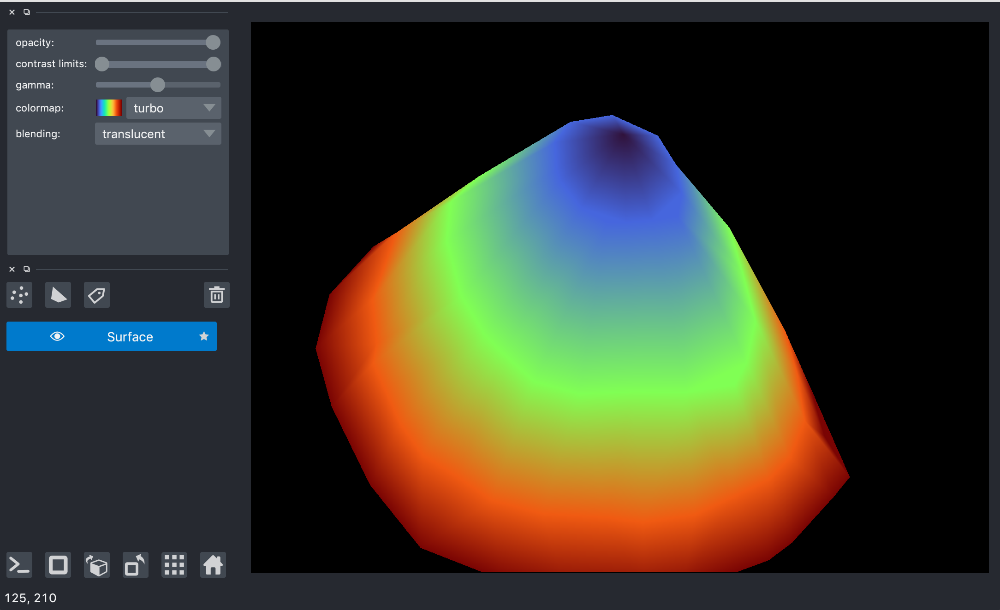
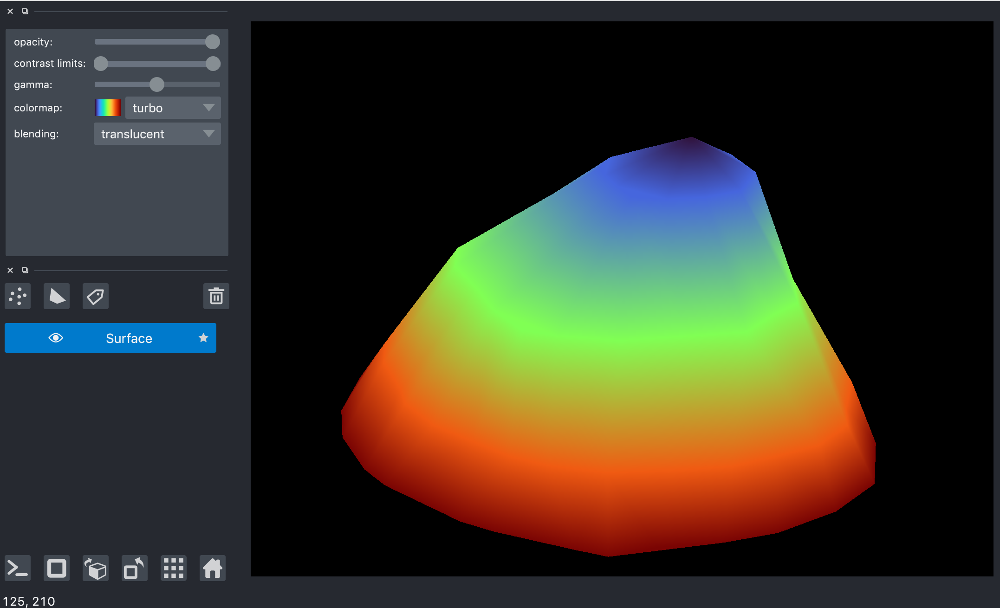

Now we show how the same can be applied to the full dataset. In addition to running segmentation to pull out the cells, we need to convert the pixel coordinates of each cell into stage coordinates so that their positions relative to surface can be computed and fed into the neural network

In [5]:
# print the names of the axes, just to make sure the position axis 
# is in the first position as the below code expects
print(list((dataset.axes.keys())).index('position'))

xyz_locations_um = []
cell_brightnesses = []
fov_positions = []
eom_voltages = []

for xy_position_index in dataset.axes['position']:
    single_xy_position_data = data[:, xy_position_index]
    
    zyx_pixel_locations, brightness = do_segmentation(single_xy_position_data)
    
    # convert these pixel coordinates into stage coordinates
    z_coord_um =  image_z_coordinates[zyx_pixel_locations[:, 0].astype(np.int)]
    
    # The XY coordinate needs to be acquired by tranforming between pixel 
    # coordinates and stage coordinates
    x_coord_pixel = zyx_pixel_locations[:, 2] 
    y_coord_pixel = zyx_pixel_locations[:, 1] 
    # the gives xy position in um relative to the center of the field of view
    xy_um_coords = np.dot(affine_transform, np.stack([x_coord_pixel, y_coord_pixel], axis=0)).T
    #now we translate it by the XY positions center to give a global coordinate in um
    global_xy_coords_um = xy_um_coords + dataset.position_centers[xy_position_index]
    #now recombine together
    xyz_coords_um = np.concatenate([global_xy_coords_um, z_coord_um.reshape([-1, 1])], axis=1)
    
    xyz_locations_um.append(xyz_coords_um)
    cell_brightnesses.append(brightness)
    fov_positions.append(zyx_pixel_locations[:, 1:])
    
    # Read EOM voltages from the metadata
    z_indices = []
    voltages = []
    for z_index in dataset.axes['z']:
        if dataset.has_image(position=xy_position_index, z=z_index):
            z_indices.append(z_index)
            # read the EOM voltage 
            voltages.append(dataset.read_metadata(
                position=xy_position_index, z=z_index)['TeensySLM-ManualVoltage'])
    # figure out which z-slice is closest to the centroid of each cell, then look
    # up what voltage was used at this slice. This allows us to apply an increasing 
    # voltage with depth in the training data generation above to more efficiently capture 
    # training data
    voltage_indices = np.argmin(np.abs(np.array(z_indices)[:, None]
                                   - xyz_coords_um[:, 2]), axis=0).shape
    eom_voltages.append(np.array(voltages)[voltage_indices])
        
    
    
cell_brightnesses = np.concatenate(cell_brightnesses, axis=0)
xyz_locations_um = np.concatenate(xyz_locations_um, axis=0)
fov_positions = np.concatenate(fov_positions, axis=0)
eom_voltages = np.concatenate(eom_voltages, axis=0)

1


Visualize global positions of standard candles relative to the surface, to make sure everything worked. It is a good idea to visualize both the locations of detected and the data itself to make sure everything is aligned properly



In [125]:
import napari

#look at the locations of detected cells
with napari.gui_qt():
    v = napari.Viewer()
    v.add_surface((surface_points, lami.simplices, 
                   surface_points[:, 2]), colormap='turbo')
    v.add_points(xyz_locations_um)

#look at the image data   
with napari.gui_qt():
    v = napari.Viewer()
    v.add_image(stitched_data)

Now we can compile all this data into the feature vectors that will be used to train the neural network that will control EOM voltage

In [6]:
from lami_helper import LAMI_helper

n_samples_theta=12 # number of radial samples
n_samples_phi=5 # number of samples between 0 and max angle of numerical aperture
phi_max_deg=50 # angle of numerical aperture in degrees

distance_histograms = []

lami = LAMI_helper(surface_points)
for i, xyz in enumerate(xyz_locations_um):
    print('computing standard candle {} of {}\r'.format(i+1, xyz_locations_um.shape[0]), end='')
    # compute distances from the cell to the surface interpolation at various angles to Z axis
    distances = lami.compute_distances(xyz, n_samples_theta=n_samples_theta,
                              n_samples_phi=n_samples_phi, phi_max_deg=phi_max_deg)
    # convert these distances into a histogram
    distance_histograms.append(lami.bin_surface_distance(distances))

distance_histograms = np.concatenate(distance_histograms, axis=0)

## 3) Train neural network to predict excitation laser control
Now we are ready to train the neural network that will predict excitation power. This part of the notebook can be run with the data computed in the previous parts, or it can be run seperately by loading in a provided set of demo data

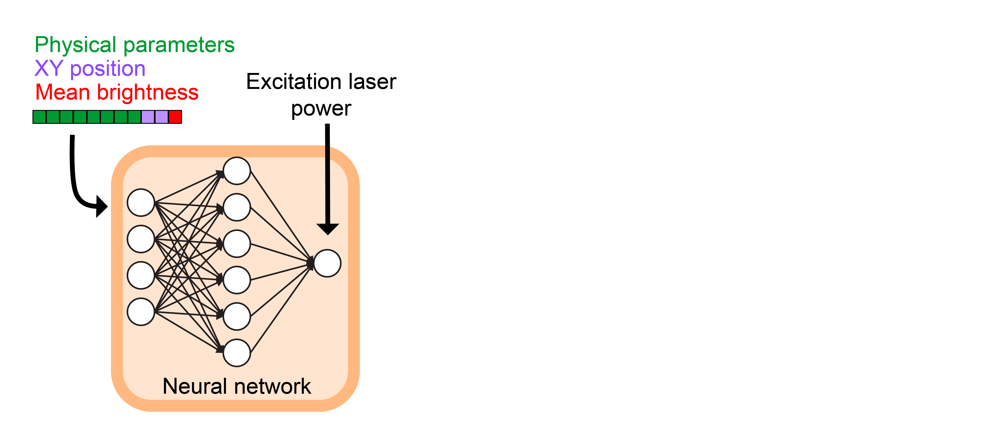

### Train network
This should take ~1 min on a laptop

In [1]:
import numpy as np
import h5py
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf

# The trained model will be saved with this name
model_export_name = 'LAMI_model'

### TODO: comment out this block if using the data computed from the previous part of the notebook
# Load the demo data for training the network
demo_data = np.load('LAMI_network_demo_data.npz')
fov_positions, brightness, distance_histograms, eom_voltages = [
    demo_data[n] for n in ['fov_position', 'brightness', 'distance_histogram', 'eom_voltage']]


# This function converts the voltage applied to the EOM to the incident power on the sample.
# This is important, because we want to train the network to minimize the error in applied
# power, not the error in applied voltage. The contents of this function is microscope specific.
# It can be determined by using a laser power meter under the microscope objective and applying different
# EOM voltages
voltage_to_power = lambda x: (tf.cos(3.1415 + 2 * 3.1415 / 510 * x) + 1) / 2

# Concatenate distance histograms, position in field of view, and brightness into feature vectors
design_matrix = np.concatenate((distance_histograms, fov_positions, brightness), axis=1)

# Custom first layer of the network that normalizes inputs to speed up training
design_mat_means = np.mean(design_matrix, axis=0)
design_mat_stddev = np.std(design_matrix, axis=0)

# position within the field of view needs to remain positive rather than having its mean 
# subtracted off. Its not entirely clear why
design_mat_means[-3:-1] = 0 # (3rd to last and second to last are position in FOV)

def normalize_histograms(design_mat, design_mat_means=design_mat_means,
                         design_mat_stddev=design_mat_stddev):
    import tensorflow as tf
    normalized = (design_mat - design_mat_means) / design_mat_stddev
    return normalized


model = keras.Sequential()
model.add(keras.Input(shape=design_matrix.shape[1]))
model.add(layers.Lambda(normalize_histograms))
model.add(layers.Dense(200, activation='tanh'))
model.add(layers.Dense(1, activation=None))

# Define a custom loss function that takes the EOM voltage output by the network and converts it
# to the incident power on the sample, so that the network minimizes error on the latter
def excitation_power_loss(y_true, y_pred):
    # dont overly penalize values outside of physical range eom can apply 
    # clip them to to min and mix 
    clipped_y = tf.minimum(255.0, tf.maximum(0.0, y_pred))
    totalSqError = tf.square(voltage_to_power(clipped_y) - voltage_to_power(y_true))
    return tf.sqrt(tf.reduce_mean(totalSqError))

# Train the model and save to the path below
model.compile(optimizer='adam', loss=excitation_power_loss)
model.fit(x=design_matrix, y=eom_voltages, batch_size=1000, validation_split=0.2, epochs=100000,
          verbose=1, steps_per_epoch=10, shuffle=True,
          callbacks=keras.callbacks.EarlyStopping(patience=50))

model.save(model_export_name, overwrite=True)

### Visualize predictions of network
Now that we've trained a model, we can visualize an XZ slice of its predictions to make sure they look reasonable. This code will pick an X location in the center of the interpolation points and use the network to generate predictions along a YZ slice at this X positions

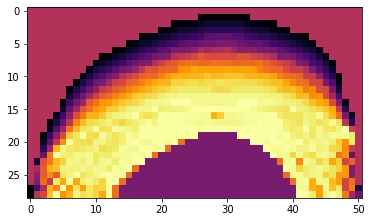

In [2]:
from tensorflow import keras
from lami_helper import LAMI_helper
import matplotlib.pyplot as plt
import numpy as np

voltage_to_power = lambda x: (np.cos(3.1415 + 2 * 3.1415 / 510 * x) + 1) / 2

pixel_size = 20 # The size of XY pixels for which to calculate predictions and display them
fov_query_position = [256, 256] # Pretend all points are at center of 512 x 512 FOV for the purposes of this
# This is the brightness level the network should aim to achieve, which can be interpretted as the number of 
# standard deviations above/below the mean brightness of the training data
query_brightness = -0.5 

#TODO: comment out loading of demo data the demo data
surface_points = np.load('LAMI_network_demo_interp_points.npy')
surface_points[:, 2] *= -1 # oritent correctly
surface_points[:, 2] -= np.min(surface_points[:, 2]) # mak the Z axis start at 0

lami = LAMI_helper(surface_points)

# Load the trained model. Add a dummy placeholder for excitation_power_loss so the load function doesn't complain
model = keras.models.load_model('LAMI_model', custom_objects={'excitation_power_loss': None})

# Generate the XYZ coordinates of the YZ plane that we're going to visualize predictions on
y_vals = np.arange(np.min(surface_points, axis=0)[1], np.max(surface_points, axis=0)[1], step=pixel_size)
z_vals = np.arange(np.min(surface_points, axis=0)[2], np.max(surface_points, axis=0)[2], step=pixel_size)
y_grid, z_grid = np.meshgrid(y_vals, z_vals)
x_val = ((np.max(surface_points, axis=0) - np.min(surface_points, axis=0)) / 2 + np.min(surface_points, axis=0))[0]
x_grid = x_val * np.ones_like(y_grid)
query_points = np.stack([x_grid, y_grid, z_grid], axis=-1)

#construct feature vectors
feature_vecs = []
for i, point in enumerate(np.reshape(query_points, [-1, 3])):
    print('Computing power prediction {} of {}\r'.format(i, query_points.size // 3), end='')   
    feature_vecs.append(lami.construct_vector(point, fov_position=fov_query_position, brightness=query_brightness))

# do predicitions
power_predictions = voltage_to_power(model.predict(np.concatenate(feature_vecs, axis=0)))
prediction_img_power = np.reshape(power_predictions, x_grid.shape)

# Figure out where the top of the interpolation is so that meaningless predictions for areas above can be ignored
surf_top = np.apply_along_axis(lambda xy : lami.get_interp_val(xy), axis=0, arr=np.stack([x_grid, y_grid], axis=0))
z_diff = surf_top - z_vals[:, None]

# Mark the regions above the surface where predictions are meaningless, for display purposes
prediction_img_power[z_diff < 0] = np.mean(prediction_img_power)

plt.imshow(np.flipud(prediction_img_power), cmap='inferno')
plt.xlabel('Y')
plt.xlabel('Z')

## 4) Use the trained model to modulate excitation power on subsequent experiments
Finally, we are ready to use the neural network in real time during an experiment to control excitation laser power. To do so, we'll use a similar setup as we used to collect training data with Pycro-Manager/Micro-Magellan. A hook function will be used to dyanimcally generate patterns to be applied to the SLM according to their position in the field of view


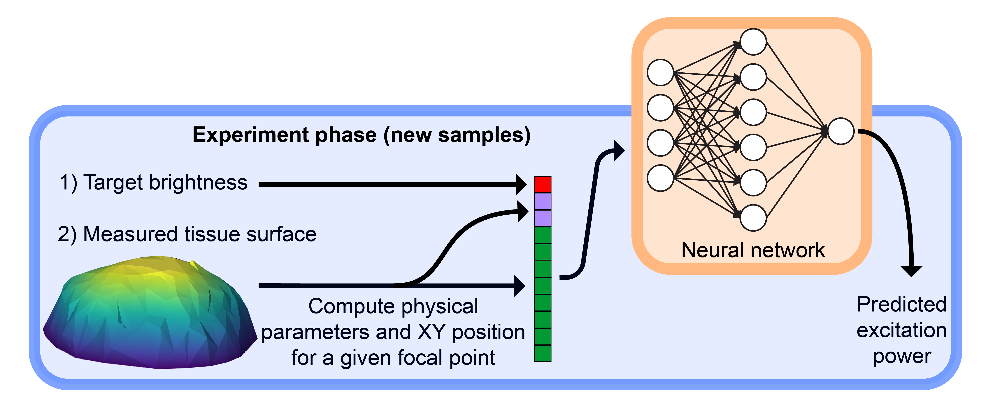


In [3]:
import numpy as np
from pycromanager import Acquisition
from lami_helper import LAMI_helper
from tensorflow import keras

# apply an 8x8 pattern onto the SLM
pattern_dimension = 8

# Load the trained model. Add a dummy placeholder for excitation_power_loss so the load function doesn't complain
model = keras.models.load_model('LAMI_model', custom_objects={'excitation_power_loss': None})

# This is the brightness level the network should aim to achieve, which can be interpretted as the number of 
# standard deviations above/below the mean brightness of the training data
query_brightness = -0.5 


# This function will be called on the creation of every acquisition event to
# compute the pattern of EOM voltages to be passed to the SLM
def hook_fn(event, bridge, event_queue):
    if not hasattr(hook_fn, 'lami'):
        # if calling for the first time, get the interpolation points from
        # Micro-Magellan, and create a LAMI_helper object to do the
        # calculations of distances relative to the surface
        magellan = bridge.get_magellan()
        surface = magellan.get_surface('New Surface 1')
        interpolation_points = surface.get_points()
        interpolation_points = np.array([(interpolation_points.get(i).x,
                                          interpolation_points.get(i).y,
                                          interpolation_points.get(i).z)
                                         for i in range(interpolation_points.size())])
        hook_fn.lami = LAMI_helper(interpolation_points)

        # For every image, we're going to compute an 8x8 pattern of EOM voltages
        # to send to the TR-SLM. 8x8 points will be in a regular grid across
        # the field of view. First, we need to apply the transformation
        # between pixel coordinates and stages coordinates in order to
        # figure out the layout of this grid in stage coordinate space.
        # We'll then store that, so it can be added to the stage position
        # center of each image for fast computation
        core = bridge.get_core()
        width = core.get_image_width()
        height = core.get_image_height()
        transform = np.array([core.get_pixel_size_affine().get(i)
                              for i in [0, 1, 3, 4]]).reshape([2, 2])
        hook_fn.y_pixel, hook_fn.x_pixel = np.meshgrid(np.linspace(-height / 2, height / 2, pattern_dimension),
                                                       np.linspace(-width / 2, width / 2, pattern_dimension))
        # apply transform to a grid of pixel coords to get a grid of stage coordinates
        x_stage, y_stage = (transform @ np.stack([hook_fn.x_pixel, hook_fn.y_pixel],
                                                 axis=0).reshape((2, -1))).reshape(2, pattern_dimension,
                                                                                   pattern_dimension)
        hook_fn.x_coord_relative = x_stage
        hook_fn.y_coord_relative = y_stage

    x, y, z = event['x'], event['y'], event['z']
    # compute the xyz coordinates of every point we're going to query
    x_coords = x + hook_fn.x_coord_relative
    y_coords = y + hook_fn.y_coord_relative

    # Build feature vectors for each point in the 8x8 grid
    feature_vectors = []
    for i in np.arange(pattern_dimension):
        for j in np.arange(pattern_dimension):
            x_stage, y_stage = x_coords[i, j], y_coords[i, j]
            # Note: the implementation of construct_vector is quite slow at the moment
            # If using this code to acquire actual data, it would be worthwhile to speed this up
            # (parallelization? caching the interpolation so it doesn't need to be recomputed?
            #  jit compilation library like numba or jax?)
            feature_vectors.append(hook_fn.lami.construct_vector(np.array([x_stage, y_stage, z]),
                                                                 fov_position=np.array([hook_fn.x_pixel[i, j],
                                                                                        hook_fn.y_pixel[i, j]]),
                                                                 brightness=query_brightness))
    # use the neural net to predict voltage for each feature vector
    pattern = model.predict(np.concatenate(feature_vectors, axis=0)).reshape((pattern_dimension, pattern_dimension))
    #clip SLM pattern to the 8 bit range of our slm
    pattern[pattern < 0] = 0
    pattern[pattern > 255] = 255
    # Add the pattern into the acquisition event, it will be applied automatically
    event['slm_pattern'] = pattern.astype(np.uint8)

    return event


# Run the Micro-Magellan acquistion that we set up in the GUI
acq = Acquisition(magellan_acq_index=0, post_hardware_hook_fn=hook_fn)